Lien github du projet : [Github](https://github.com/QuentinNav/Clustering-de-produits-alimentaires "Clustering de produits alimentaires")

# Partie A : word2vec des ingrédients

## Installation, import des librairies et des fonctions nécessaires à la partie A

In [ ]:
#Import du drive 
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install umap-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from clustering import *
from config import data_path, model_path

## Chargement des données

In [ ]:
#Loading data : 
df= pd.read_csv(data_path+"cleaned_data.csv", sep="\t", low_memory=False)
df['liste_ingredients'] = df['liste_ingredients'].str.strip('[]').str.replace(" ","").str.replace("'","").str.split(',')
df["product_name"]= df["product_name"].astype(str)
df.head()

,product_name,ingredients_tags,liste_ingredients,nombre_ingredients_pre_filtre,nombre_ingredients,nombre_ingredients_perdus,part_ingredients_perdus
0,L.casei,"{'en': ['semi-skimmed-milk', 'dairy', 'milk', ...","[semi-skimmed-milk, dairy, milk, sugar, added-...",14,12,2,0.142857
1,Solène céréales poulet,"{'en': ['antioxidant', 'colour', 'tomato', 've...","[antioxidant, colour, tomato, vegetable, mayon...",32,32,0,0.000000
2,Crème dessert chocolat,"{'en': ['whole-milk', 'dairy', 'milk', 'sugar'...","[whole-milk, dairy, milk, sugar, added-sugar, ...",10,10,0,0.000000
3,Baguette Poitevin,"{'en': [None, 'water', 'salt', 'yeast', 'glute...","[water, salt, yeast, gluten, e300, wheat-flour...",23,14,9,0.391304
4,Suedois saumon,"{'en': [None, 'water', 'rye-flour', 'flour', '...","[water, rye-flour, flour, cereal-flour, sugar,...",42,36,6,0.142857


## Training the word2vec model

Nous avons environ 800 ingrédients différents ce qui est peu par rapport à la taille du vocabulaire dans des modèles de NLP traitants de texte(comprenant généralement plusieurs milliers de mots) nous choisissons arbitrairement de prendre une taille d'embedding plutôt petite d'une quinzaine de dimensions. \
Pour tester la cohérence du word2vec nous réduisons ensuite les dimensions de 15 à 2 pour afficher les ingrédients sur une carte et voir s'ils s'organisent de manière cohérente.  


Nous choisissons un modèle Skip gram sans préciser de distance de fenêtre maximale car l'ordre des tokens dans chaque document n'a pas d'importance dans notre cas. \
Nous souhaitons juste que les vecteurs soient calculés en fonction des occurences entre chaque ingrédient dans les différents produits. 

In [ ]:
model_name = "word2vec15CSG"

In [ ]:
#Entraînement du model
model = Word2Vec(sentences=df["liste_ingredients"], size=15, workers=4,seed =42, sg=1) 
model.wv.save(model_path+model_name+".wordvectors")

In [ ]:
#results : 
df_results = pd.DataFrame()
df_results["ingredient"]= [x[0] for x in model.wv.vocab.items()]
df_results["ingredient"] = df_results["ingredient"].astype(str)

list_columns=["dim_"+str(dim+1) for dim in range(len(model[list(model.wv.vocab.keys())[0]]))]

df_results[list_columns]=df_results.apply(lambda row: model.wv[row.ingredient], axis='columns', result_type='expand') 
df_results=df_results.set_index("ingredient")

df_results.to_csv(data_path+"ingredients_word2vec.csv",index=True, sep="\t")
df_results.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,dim_14,dim_15
ingredient,,,,,,,,,,,,,,,
semi-skimmed-milk,-1.356199,-0.269292,0.585668,0.283947,0.373141,-0.232849,0.566497,0.087994,0.008522,-0.107520,0.637058,-1.027239,0.486392,-0.571366,0.157028
dairy,-1.003779,-0.649851,0.203489,0.508861,0.582758,0.403989,0.434332,-0.595374,-0.214006,-0.183570,0.393287,-0.883933,0.230411,-0.335802,0.419919
milk,-1.130293,-0.664711,0.288226,0.490643,0.417961,0.113500,0.415383,-0.514224,0.177608,0.098012,0.270121,-0.669801,0.177212,-0.451612,0.011921
sugar,0.166919,-0.380515,-0.082900,0.435718,0.588095,-0.178151,0.520020,-0.368368,-0.041126,-0.556826,0.283092,-0.363201,-0.078687,-0.352442,0.648472
added-sugar,0.198725,-0.377257,-0.070209,0.302833,0.552530,-0.235795,0.601683,-0.458263,-0.052005,-0.627520,0.307685,-0.325914,-0.070757,-0.317077,0.725126


In [ ]:
df_results.describe()

,dim_1,dim_2,dim_3,dim_4,dim_5,dim_6,dim_7,dim_8,dim_9,dim_10,dim_11,dim_12,dim_13,dim_14,dim_15
count,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000,812.000000
mean,-0.084071,-0.281056,0.351826,0.240076,0.555817,-0.252535,0.610863,-0.099723,0.135144,0.433179,0.170848,-0.073535,0.141509,-0.331061,0.628802
std,0.563894,0.531823,0.545749,0.586072,0.554539,0.559657,0.446929,0.503364,0.621582,0.574882,0.633958,0.582885,0.482443,0.494350,0.549137
min,-1.729744,-2.181722,-1.441592,-1.080839,-0.885032,-2.805851,-0.773066,-1.581575,-1.666421,-1.383597,-1.947385,-2.244015,-1.188586,-2.800659,-0.787261
25%,-0.408579,-0.664535,-0.025146,-0.173060,0.209911,-0.636704,0.322956,-0.455321,-0.281624,0.044418,-0.269550,-0.410363,-0.221763,-0.594425,0.246102
50%,-0.022774,-0.265408,0.350554,0.173050,0.533804,-0.215859,0.582117,-0.112699,0.070097,0.421491,0.217997,-0.068436,0.140505,-0.295788,0.551630
75%,0.248567,0.083074,0.665487,0.611117,0.960692,0.170682,0.915783,0.231237,0.472880,0.849748,0.622181,0.363332,0.466799,-0.036271,0.920535
max,2.661391,1.234983,2.134410,2.779443,1.969641,0.909762,2.060644,1.698110,2.665900,2.324773,2.030940,1.424683,1.497437,1.074728,2.487246


## Réduction des dimensions des ingrédients 

Nous pouvons réduire les dimensions avec plusieurs méthodes :
* tsne
* UMAP 
* Analyse en composantes principales

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


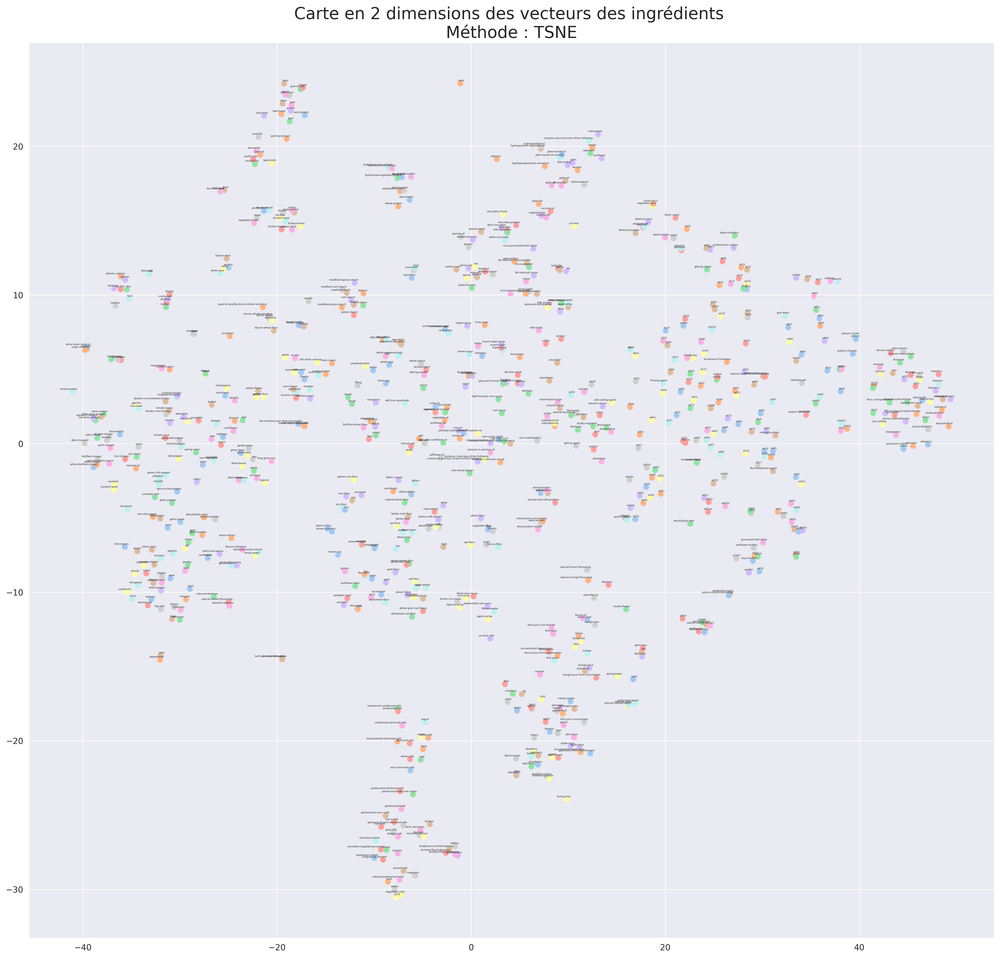

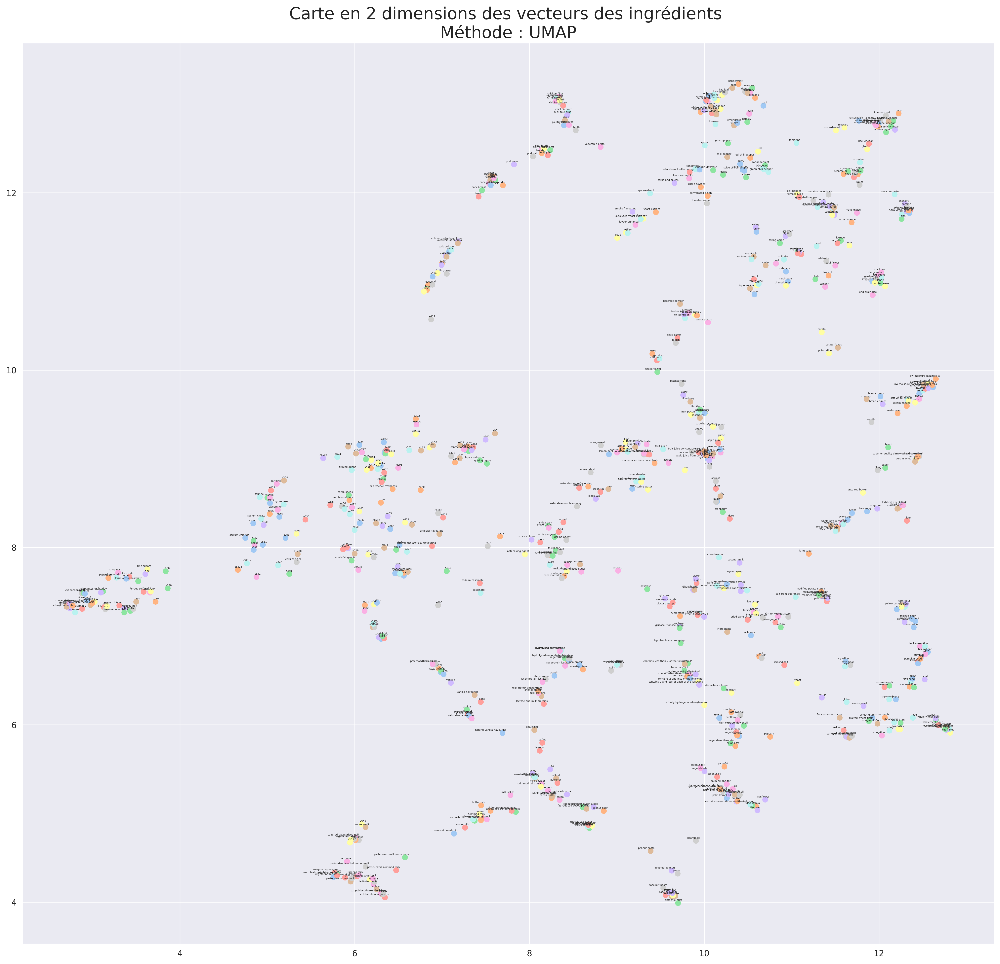

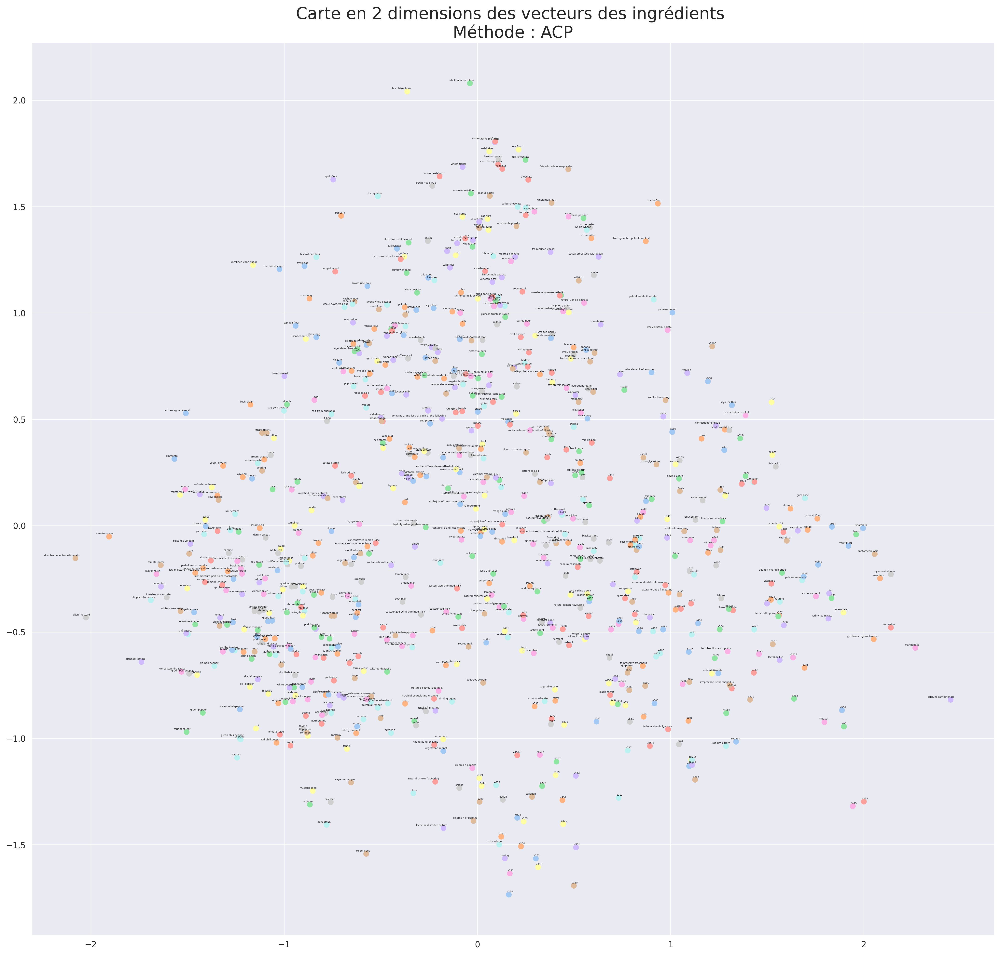

In [ ]:
plot_tsne(model)
plot_UMAP(model)
plot_PCA(model)

Nous observons qu'avec la méthode UMAP les clusters de mots sont plus espacés ce qui rend la lecture de la carte plus lisible. 

### Nous effectuons un clustering kmeans sur les vecteurs en 2 dimensions UMAP pour avoir un beau rendu visuel :

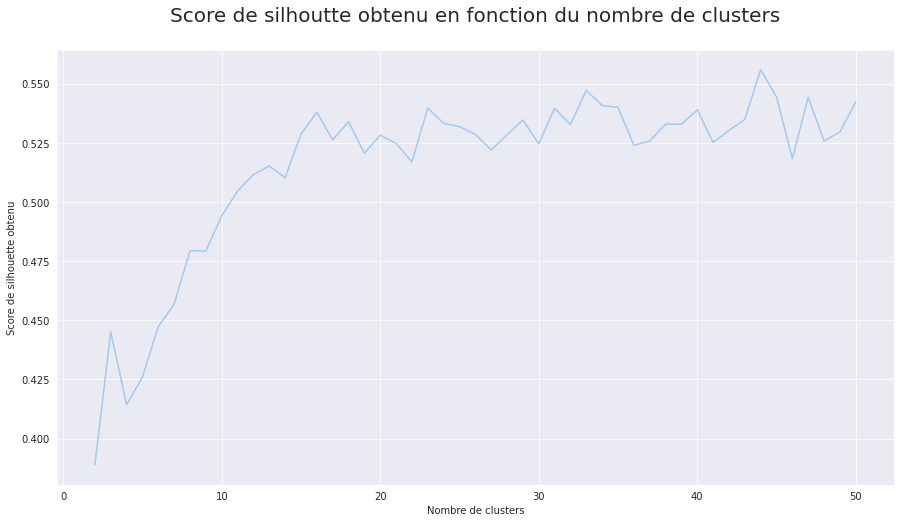

D'après le score de silhouette le meilleur nombre de clusters pour le clustering est de 44 pour un score de 0.5559999942779541


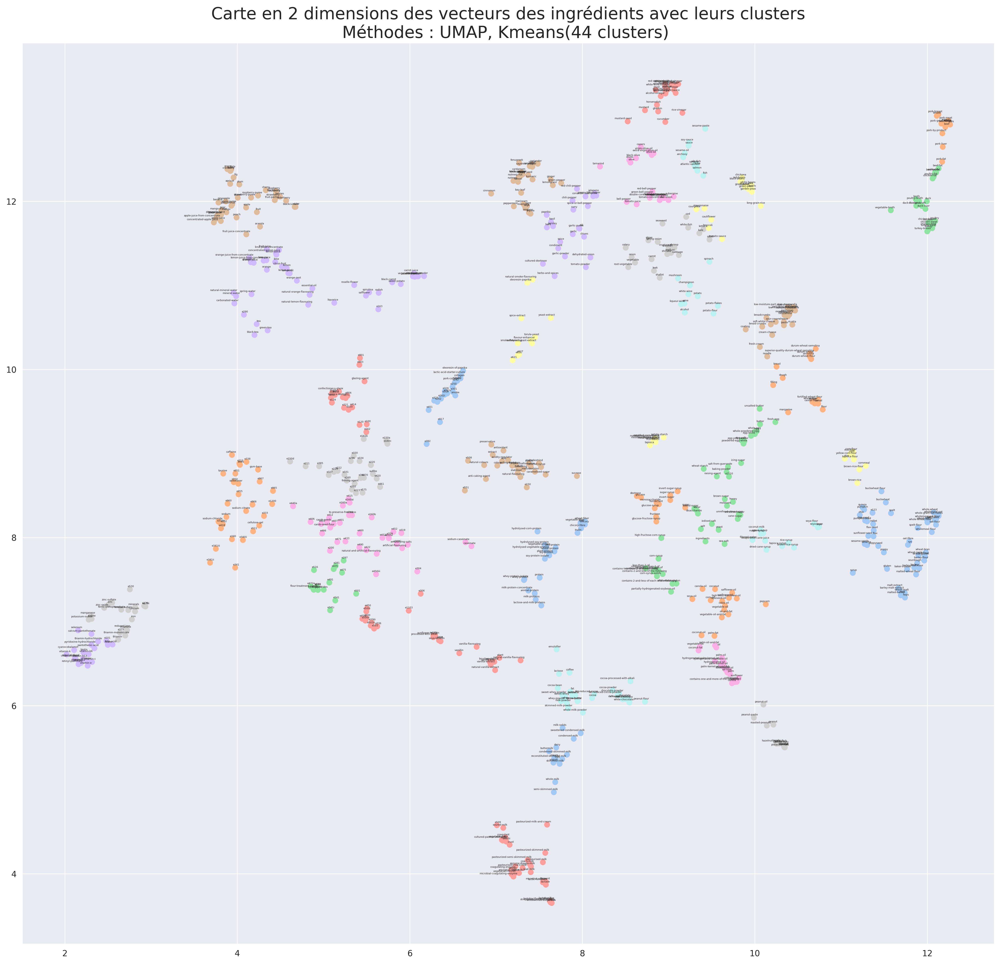

In [ ]:
_=clustering(model)

En déterminant le nombre de clusters avec la méthode du score de silhoutette nous observons que certains clusters sont étranges (le cluster de coordonées (2,11) ne devrait pas être coupé en 2) nous décidons donc de réduire le nombre de clusters manuellement en le fixant à 30.

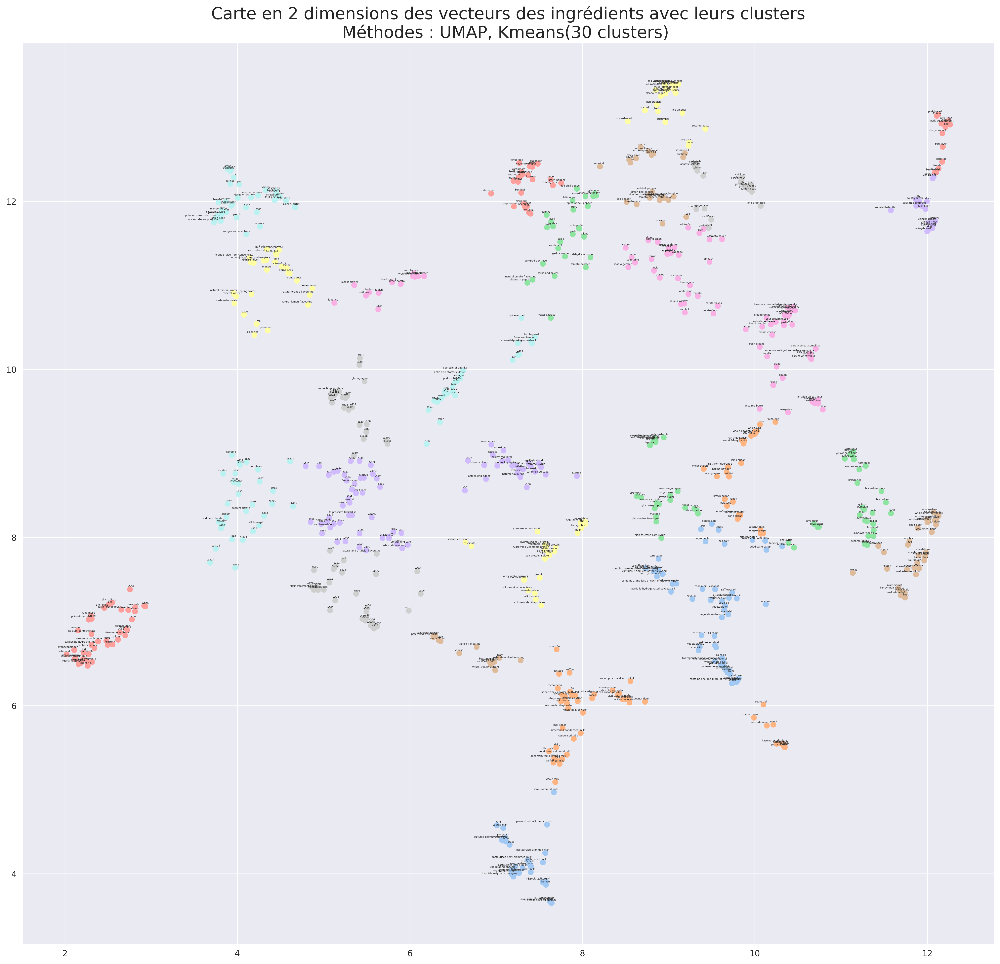

In [ ]:
df_results = clustering(model, nb_clusters= 30, plot=False)